# MÉTODO DE ENTRADA DE VENTANA FECHA Y VALOR 2016 - 672

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, -1]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, 1), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 2016 valores de entrada que corresponde a las 3 semanas anteriores y una salida de 672 valores que corresponden al consumo de la siguiente semana

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 2016           # Número de mediciones en las 3 semanas anteriores
n_predicciones = 672       # Mediciones en una semana
n_features = 1
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(42528, 2016, 1)

In [19]:
data_trainY.shape

(42528, 672)

In [20]:
data_valX.shape

(7002, 2016, 1)

In [21]:
data_valY.shape

(7002, 672)

In [22]:
data_testX.shape

(7002, 2016, 1)

In [23]:
data_testY.shape

(7002, 672)

In [24]:
data_trainX[0]

array([[0.087],
       [0.1  ],
       [0.084],
       ...,
       [0.362],
       [0.305],
       [0.055]])

In [25]:
data_trainY[0]

array([0.126, 0.04 , 0.017, 0.019, 0.022, 0.012, 0.131, 0.004, 0.037,
       0.009, 0.026, 0.015, 0.014, 0.028, 0.004, 0.036, 0.004, 0.024,
       0.017, 0.009, 0.031, 0.004, 0.032, 0.008, 0.017, 0.022, 0.004,
       0.035, 0.004, 0.025, 0.014, 0.011, 0.028, 0.004, 0.032, 0.007,
       0.022, 0.063, 0.015, 0.081, 0.025, 0.017, 0.032, 0.011, 0.037,
       0.016, 0.252, 0.422, 0.316, 0.028, 0.216, 0.448, 0.209, 0.03 ,
       0.152, 0.051, 0.03 , 0.052, 0.051, 0.107, 0.088, 0.051, 0.026,
       0.051, 0.038, 0.036, 0.051, 0.051, 0.041, 0.018, 0.056, 0.06 ,
       0.114, 0.187, 0.054, 0.207, 0.265, 0.25 , 0.156, 0.057, 0.198,
       0.045, 0.063, 0.061, 0.166, 0.322, 0.062, 0.062, 0.229, 0.428,
       0.159, 0.062, 0.17 , 0.059, 0.069, 0.045, 0.049, 0.037, 0.046,
       0.014, 0.029, 0.014, 0.028, 0.015, 0.027, 0.016, 0.025, 0.017,
       0.023, 0.018, 0.023, 0.017, 0.022, 0.022, 0.02 , 0.021, 0.016,
       0.024, 0.012, 0.028, 0.007, 0.034, 0.004, 0.036, 0.005, 0.029,
       0.01 , 0.024,

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(42528, 2016, 1)

In [28]:
scaled_valX.shape

(7002, 2016, 1)

In [29]:
scaled_testX.shape

(7002, 2016, 1)

In [30]:
scaled_trainX[0]

array([[0.12869822],
       [0.14792899],
       [0.12426036],
       ...,
       [0.53550296],
       [0.45118343],
       [0.08136095]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [33]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model2 = build_model2()
model2.summary()

2022-06-24 14:02:29.749904: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 14:02:30.261019: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30514 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:d7:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 2016, 128)         66560     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 672)               86688     
                                                                 
Total params: 284,832
Trainable params: 284,832
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 14:02:33.914856: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


333/333 [==============================] - 77s 223ms/step - loss: 0.0066 - mae: 0.0487 - mse: 0.0066 - smape: 0.8706 - val_loss: 0.0069 - val_mae: 0.0494 - val_mse: 0.0069 - val_smape: 0.8929
Epoch 2/200
333/333 [==============================] - 74s 221ms/step - loss: 0.0060 - mae: 0.0467 - mse: 0.0060 - smape: 0.8245 - val_loss: 0.0067 - val_mae: 0.0482 - val_mse: 0.0067 - val_smape: 0.8469
Epoch 3/200
333/333 [==============================] - 73s 220ms/step - loss: 0.0059 - mae: 0.0460 - mse: 0.0059 - smape: 0.8108 - val_loss: 0.0069 - val_mae: 0.0491 - val_mse: 0.0069 - val_smape: 0.8906
Epoch 4/200
333/333 [==============================] - 73s 220ms/step - loss: 0.0058 - mae: 0.0453 - mse: 0.0058 - smape: 0.7944 - val_loss: 0.0068 - val_mae: 0.0482 - val_mse: 0.0068 - val_smape: 0.8377
Epoch 5/200
333/333 [==============================] - 73s 221ms/step - loss: 0.0057 - mae: 0.0447 - mse: 0.0057 - smape: 0.7878 - val_loss: 0.0067 - val_mae: 0.0483 - val_mse: 0.0067 - val_smape:

333/333 [==============================] - 73s 220ms/step - loss: 0.0050 - mae: 0.0411 - mse: 0.0050 - smape: 0.7493 - val_loss: 0.0070 - val_mae: 0.0459 - val_mse: 0.0070 - val_smape: 0.8069
Epoch 82/200
333/333 [==============================] - 73s 220ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7536 - val_loss: 0.0070 - val_mae: 0.0457 - val_mse: 0.0070 - val_smape: 0.8082
Epoch 83/200
333/333 [==============================] - 73s 219ms/step - loss: 0.0050 - mae: 0.0412 - mse: 0.0050 - smape: 0.7502 - val_loss: 0.0070 - val_mae: 0.0464 - val_mse: 0.0070 - val_smape: 0.8103
Epoch 84/200
333/333 [==============================] - 73s 221ms/step - loss: 0.0049 - mae: 0.0410 - mse: 0.0049 - smape: 0.7486 - val_loss: 0.0070 - val_mae: 0.0456 - val_mse: 0.0070 - val_smape: 0.8025
Epoch 85/200
333/333 [==============================] - 74s 222ms/step - loss: 0.0049 - mae: 0.0410 - mse: 0.0049 - smape: 0.7485 - val_loss: 0.0071 - val_mae: 0.0452 - val_mse: 0.0071 - val_sm

In [36]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006601,0.048723,0.006601,0.870642,0.006851,0.049354,0.006851,0.892927,0
1,0.006025,0.046669,0.006025,0.824478,0.006728,0.048217,0.006728,0.846936,1
2,0.005923,0.046049,0.005923,0.810843,0.006857,0.049098,0.006857,0.890600,2
3,0.005782,0.045264,0.005782,0.794412,0.006762,0.048210,0.006762,0.837708,3
4,0.005705,0.044717,0.005705,0.787812,0.006717,0.048340,0.006717,0.847310,4
...,...,...,...,...,...,...,...,...,...
84,0.004926,0.040985,0.004926,0.748488,0.007073,0.045172,0.007073,0.798322,84
85,0.004913,0.040942,0.004913,0.748540,0.006956,0.045079,0.006956,0.798742,85
86,0.004905,0.040921,0.004905,0.748686,0.007155,0.047480,0.007155,0.824274,86
87,0.004895,0.040893,0.004895,0.748908,0.007123,0.047121,0.007123,0.820301,87


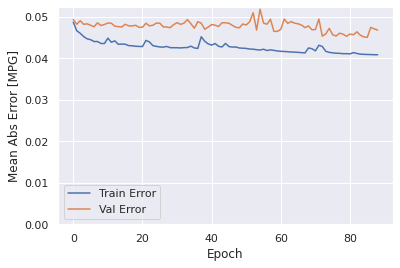

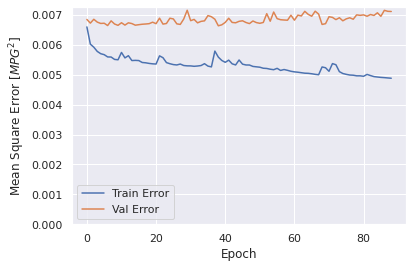

In [37]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [38]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1329/1329 [==============================] - 85s 64ms/step - loss: 0.0049 - mae: 0.0409 - mse: 0.0049 - smape: 0.7496
Loss:0.004863834008574486
MAE:0.04093899950385094
MSE:0.004863834008574486
SMAPE:0.7496224641799927


In [39]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

219/219 [==============================] - 16s 72ms/step - loss: 0.0071 - mae: 0.0468 - mse: 0.0071 - smape: 0.8167
Loss:0.007117401342839003
MAE:0.04683376103639603
MSE:0.007117401342839003
SMAPE:0.8166746497154236


In [40]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

219/219 [==============================] - 16s 71ms/step - loss: 0.0066 - mae: 0.0467 - mse: 0.0066 - smape: 0.7742
Loss:0.006585960276424885
MAE:0.04672985523939133
MSE:0.006585960276424885
SMAPE:0.7741913199424744


### Comparativa de resultados

In [41]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.040880,0.004885,0.749207,0.069895
VALIDACION,0.046834,0.007117,0.817564,0.084365
TEST,0.046730,0.006586,0.774191,0.081154


### Obtener predicciones

In [42]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

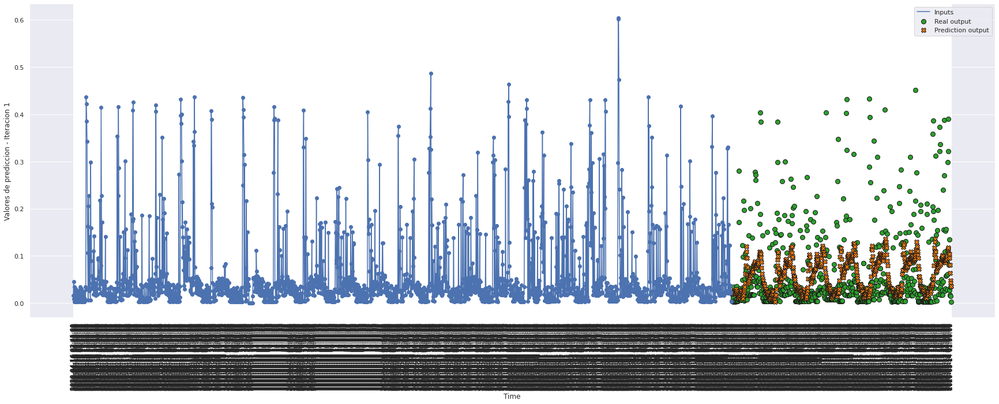

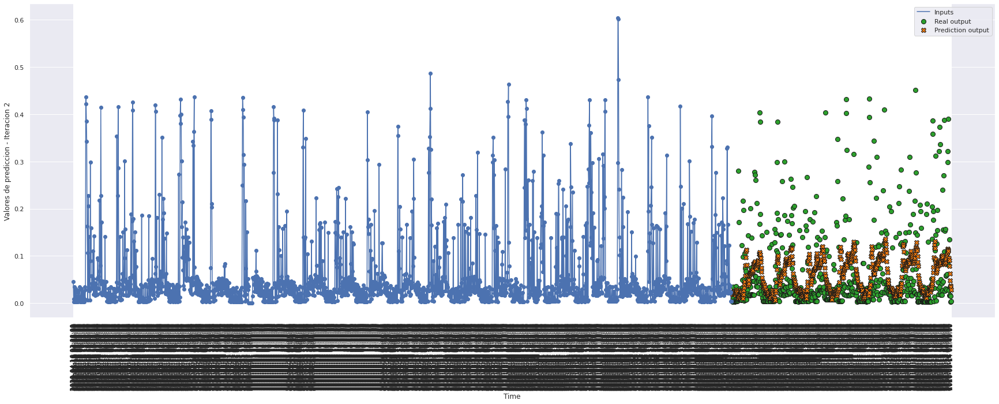

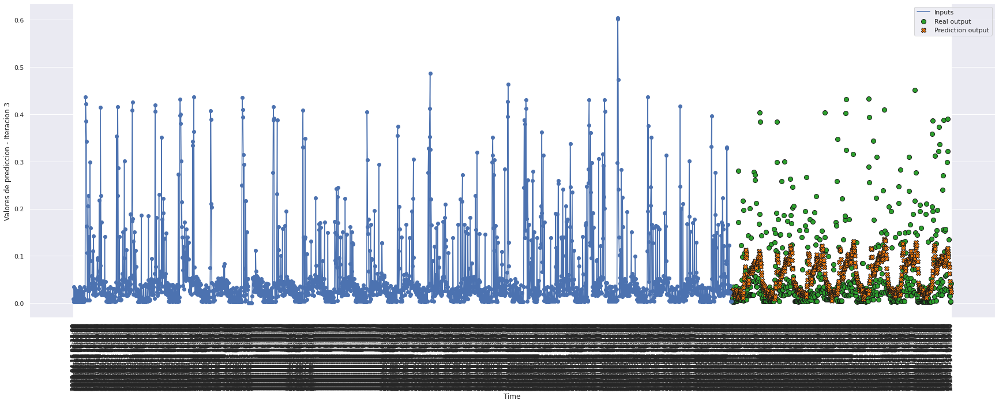

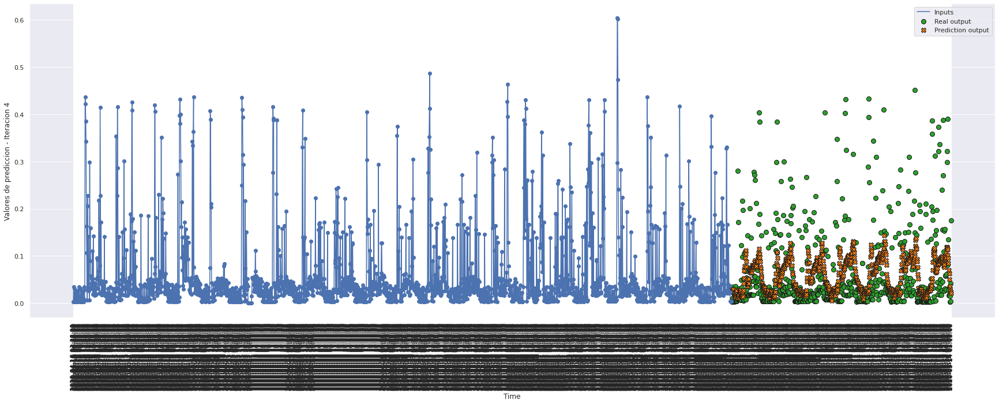

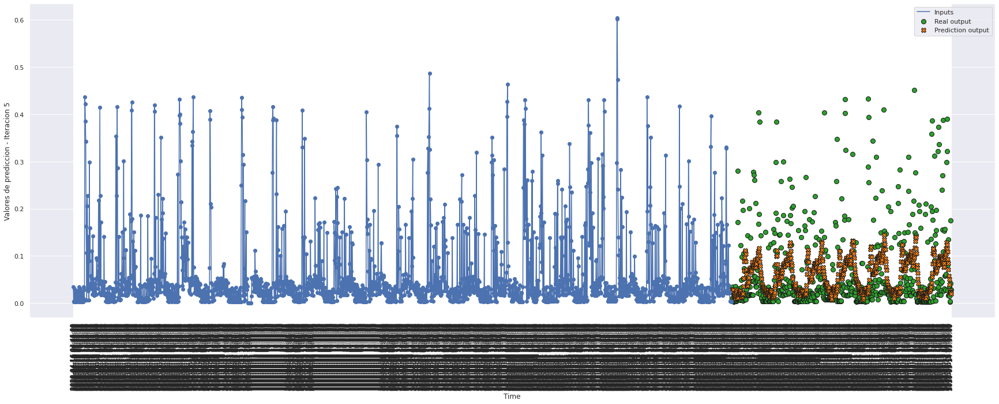

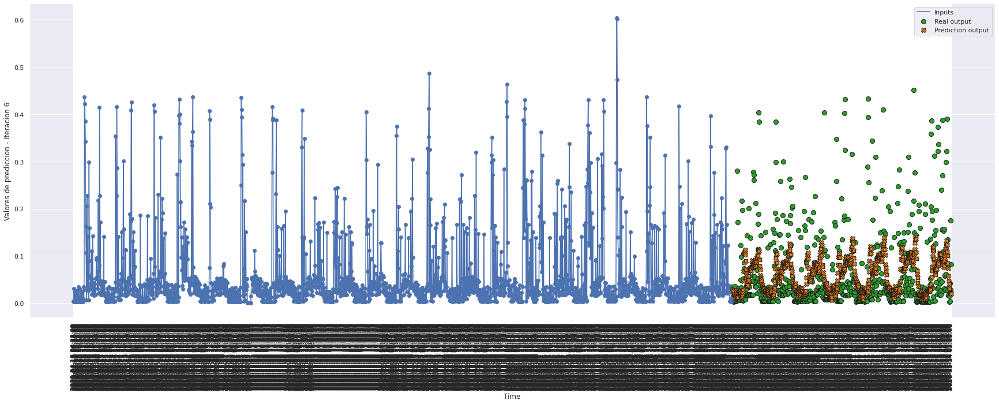

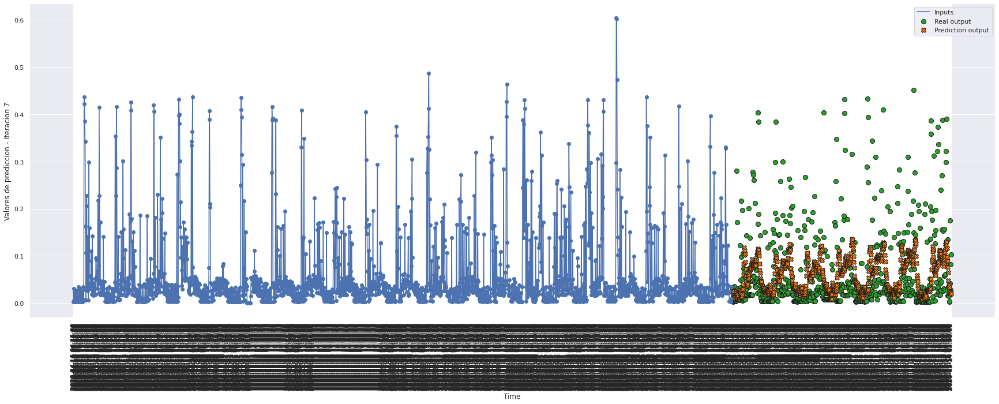

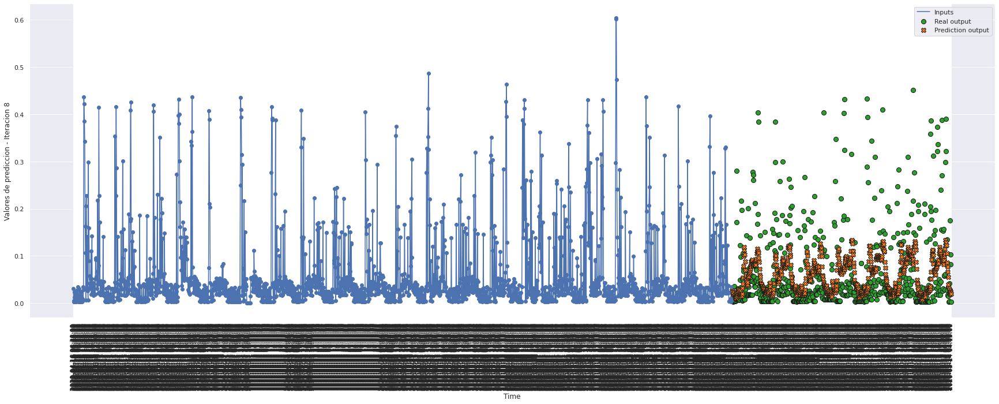

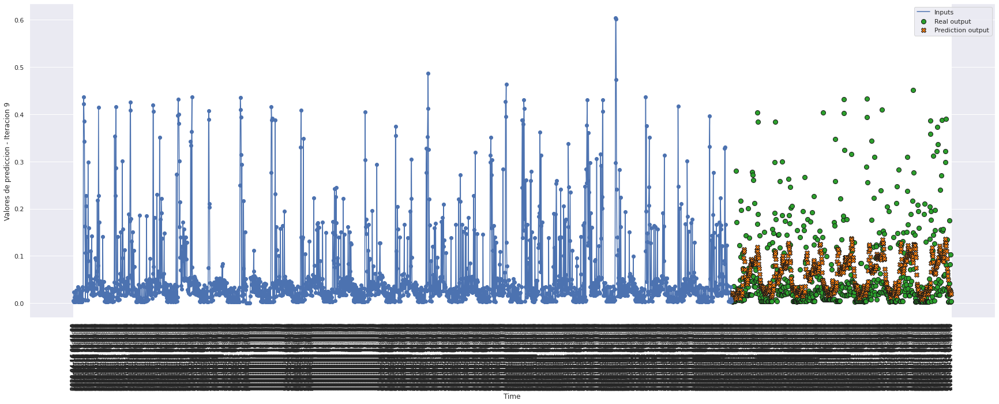

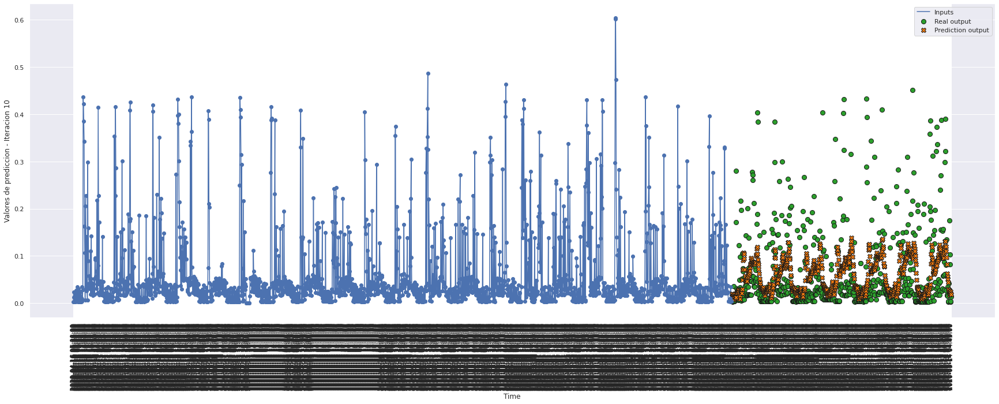

In [43]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 10, 0)

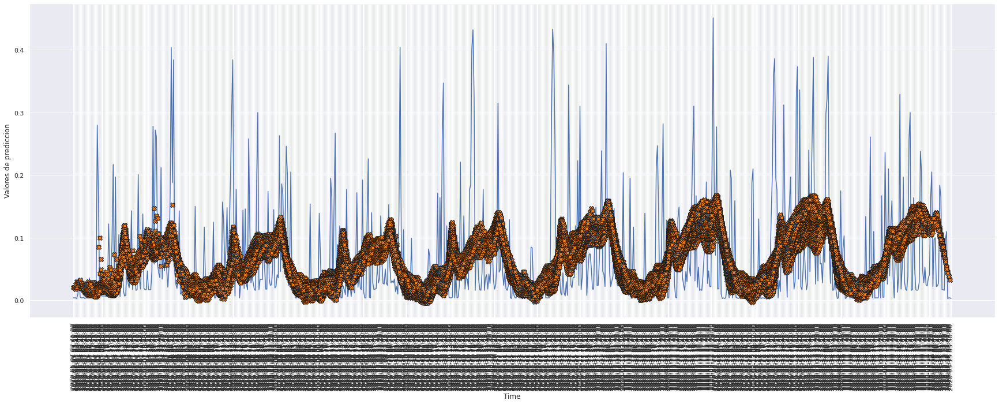

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 100)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [45]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [46]:
model10 = build_model10()
model10.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               50304     
                                                                 
 dense_1 (Dense)             (None, 672)               86688     
                                                                 
Total params: 136,992
Trainable params: 136,992
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [47]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
333/333 [==============================] - 37s 107ms/step - loss: 0.0068 - mae: 0.0495 - mse: 0.0068 - smape: 0.8753 - val_loss: 0.0070 - val_mae: 0.0486 - val_mse: 0.0070 - val_smape: 0.8626
Epoch 2/200
333/333 [==============================] - 35s 104ms/step - loss: 0.0063 - mae: 0.0477 - mse: 0.0063 - smape: 0.8470 - val_loss: 0.0068 - val_mae: 0.0489 - val_mse: 0.0068 - val_smape: 0.8808
Epoch 3/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0061 - mae: 0.0471 - mse: 0.0061 - smape: 0.8355 - val_loss: 0.0067 - val_mae: 0.0481 - val_mse: 0.0067 - val_smape: 0.8523
Epoch 4/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0060 - mae: 0.0464 - mse: 0.0060 - smape: 0.8171 - val_loss: 0.0068 - val_mae: 0.0489 - val_mse: 0.0068 - val_smape: 0.8693
Epoch 5/200
333/333 [==============================] - 35s 106ms/step - loss: 0.0059 - mae: 0.0459 - mse: 0.0059 - smape: 0.8082 - val_loss: 0.0067 - val_mae: 0.0484 - val_mse: 0.0067 

333/333 [==============================] - 35s 106ms/step - loss: 0.0055 - mae: 0.0434 - mse: 0.0055 - smape: 0.7730 - val_loss: 0.0068 - val_mae: 0.0483 - val_mse: 0.0068 - val_smape: 0.8513
Epoch 42/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0055 - mae: 0.0434 - mse: 0.0055 - smape: 0.7723 - val_loss: 0.0067 - val_mae: 0.0485 - val_mse: 0.0067 - val_smape: 0.8473
Epoch 43/200
333/333 [==============================] - 35s 106ms/step - loss: 0.0055 - mae: 0.0434 - mse: 0.0055 - smape: 0.7717 - val_loss: 0.0067 - val_mae: 0.0477 - val_mse: 0.0067 - val_smape: 0.8369
Epoch 44/200
333/333 [==============================] - 35s 106ms/step - loss: 0.0054 - mae: 0.0433 - mse: 0.0054 - smape: 0.7710 - val_loss: 0.0068 - val_mae: 0.0485 - val_mse: 0.0068 - val_smape: 0.8380
Epoch 45/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0055 - mae: 0.0433 - mse: 0.0055 - smape: 0.7710 - val_loss: 0.0067 - val_mae: 0.0481 - val_mse: 0.0067 - val_sm

333/333 [==============================] - 35s 106ms/step - loss: 0.0064 - mae: 0.0483 - mse: 0.0064 - smape: 0.8450 - val_loss: 0.0071 - val_mae: 0.0501 - val_mse: 0.0071 - val_smape: 0.8819
Epoch 82/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0064 - mae: 0.0482 - mse: 0.0064 - smape: 0.8434 - val_loss: 0.0071 - val_mae: 0.0503 - val_mse: 0.0071 - val_smape: 0.8853
Epoch 83/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0064 - mae: 0.0482 - mse: 0.0064 - smape: 0.8432 - val_loss: 0.0071 - val_mae: 0.0494 - val_mse: 0.0071 - val_smape: 0.8716
Epoch 84/200
333/333 [==============================] - 35s 105ms/step - loss: 0.0064 - mae: 0.0482 - mse: 0.0064 - smape: 0.8444 - val_loss: 0.0071 - val_mae: 0.0496 - val_mse: 0.0071 - val_smape: 0.8795
Epoch 85/200
333/333 [==============================] - 35s 106ms/step - loss: 0.0064 - mae: 0.0480 - mse: 0.0064 - smape: 0.8415 - val_loss: 0.0071 - val_mae: 0.0495 - val_mse: 0.0071 - val_sm

In [48]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006840,0.049529,0.006840,0.875291,0.006954,0.048619,0.006954,0.862591,0
1,0.006312,0.047729,0.006312,0.847002,0.006762,0.048891,0.006762,0.880784,1
2,0.006101,0.047137,0.006101,0.835540,0.006749,0.048081,0.006749,0.852312,2
3,0.005980,0.046442,0.005980,0.817050,0.006763,0.048890,0.006763,0.869269,3
4,0.005868,0.045900,0.005868,0.808244,0.006750,0.048416,0.006750,0.844768,4
...,...,...,...,...,...,...,...,...,...
84,0.006381,0.048038,0.006381,0.841543,0.007073,0.049519,0.007073,0.877392,84
85,0.006378,0.048032,0.006378,0.841597,0.007209,0.050622,0.007209,0.893578,85
86,0.006382,0.048065,0.006382,0.842352,0.007082,0.049960,0.007082,0.879061,86
87,0.006380,0.048077,0.006380,0.842808,0.007051,0.049974,0.007051,0.882988,87


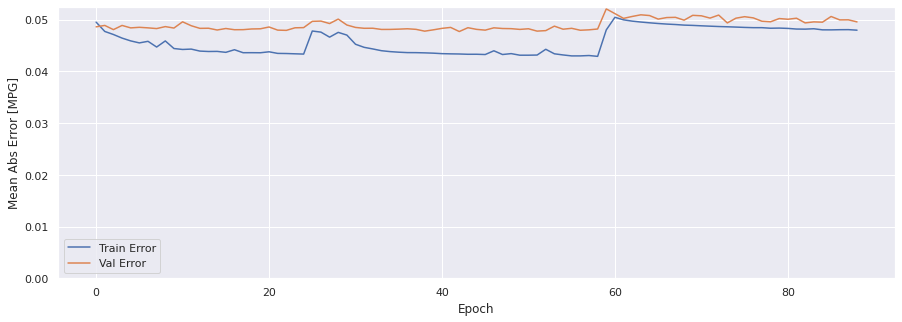

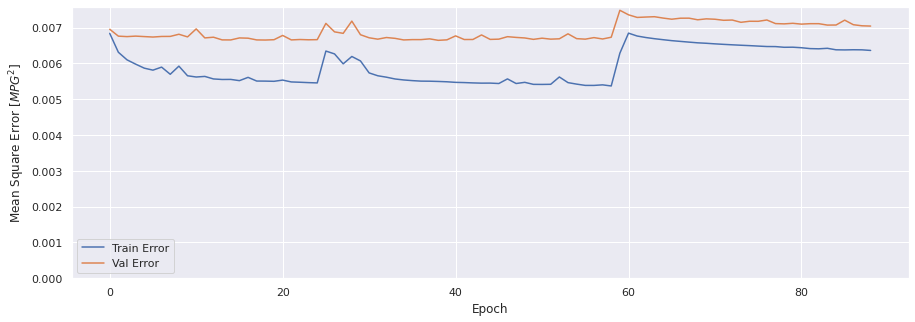

In [49]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [50]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

1329/1329 [==============================] - 47s 35ms/step - loss: 0.0063 - mae: 0.0477 - mse: 0.0063 - smape: 0.8382
Loss:0.006322271656244993
MAE:0.04771804437041283
MSE:0.006322271656244993
SMAPE:0.8382039070129395


In [51]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

219/219 [==============================] - 8s 38ms/step - loss: 0.0070 - mae: 0.0496 - mse: 0.0070 - smape: 0.8759
Loss:0.00704360194504261
MAE:0.04957177862524986
MSE:0.00704360194504261
SMAPE:0.8758572340011597


In [52]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

219/219 [==============================] - 8s 38ms/step - loss: 0.0064 - mae: 0.0483 - mse: 0.0064 - smape: 0.8241
Loss:0.006410402711480856
MAE:0.048327475786209106
MSE:0.006410402711480856
SMAPE:0.8240693211555481


### Comparativa de resultados

In [53]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.047973,0.006363,0.841269,0.079769
VALIDACION,0.049572,0.007044,0.876787,0.083926
TEST,0.048327,0.006410,0.824069,0.080065


### Obtener predicciones

In [54]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

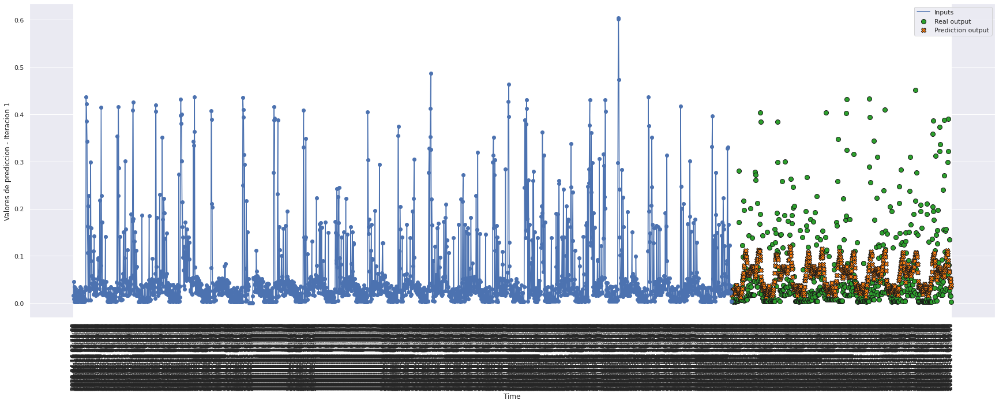

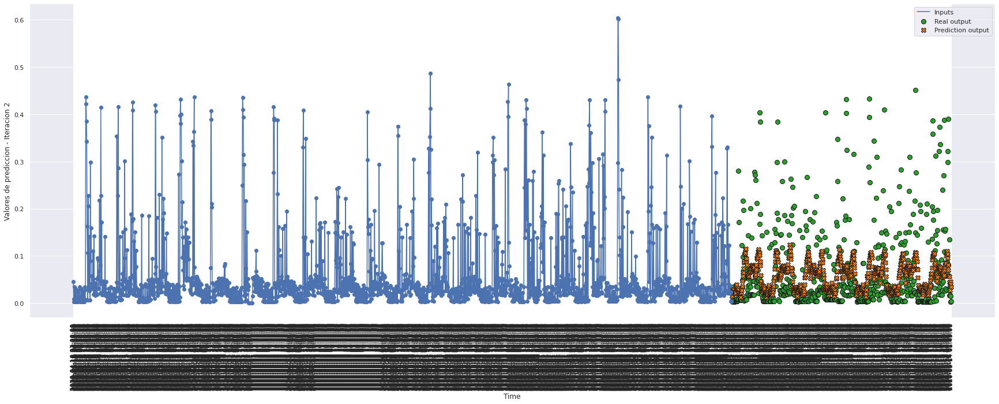

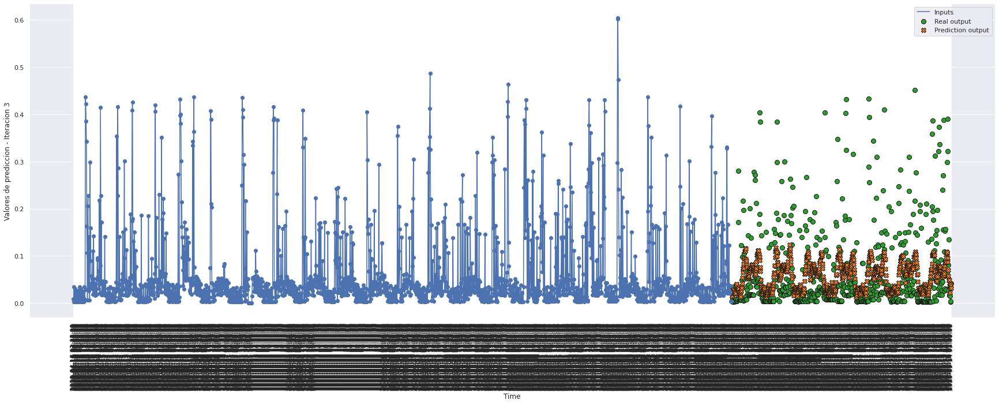

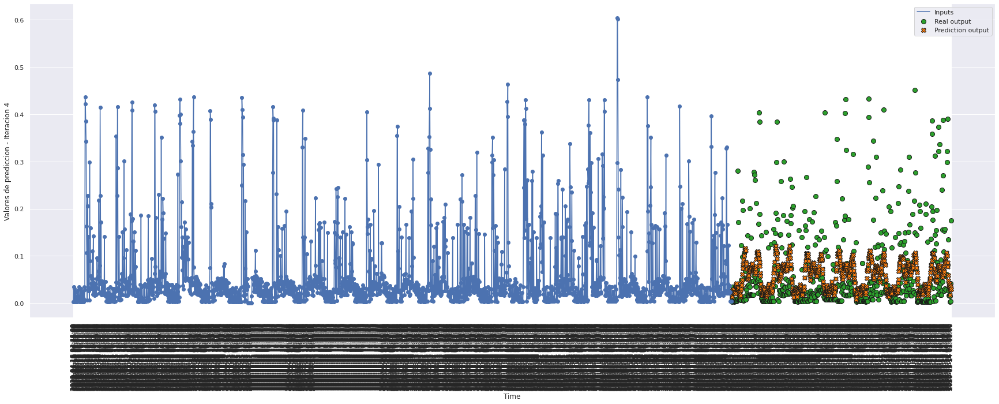

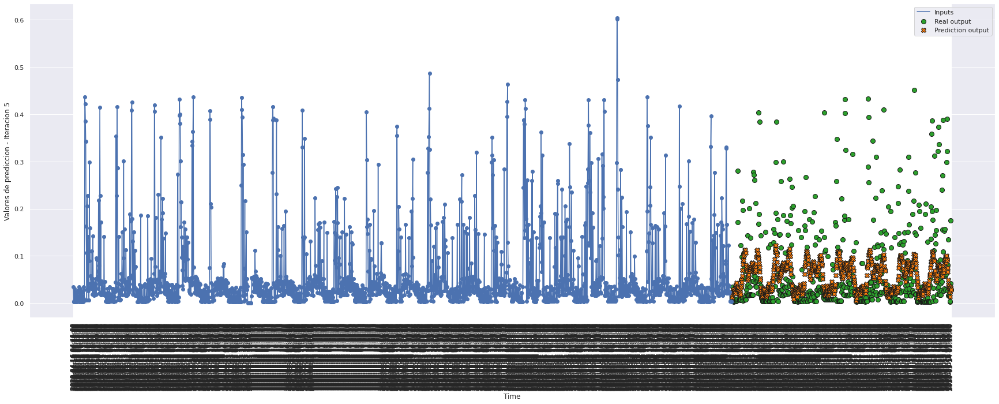

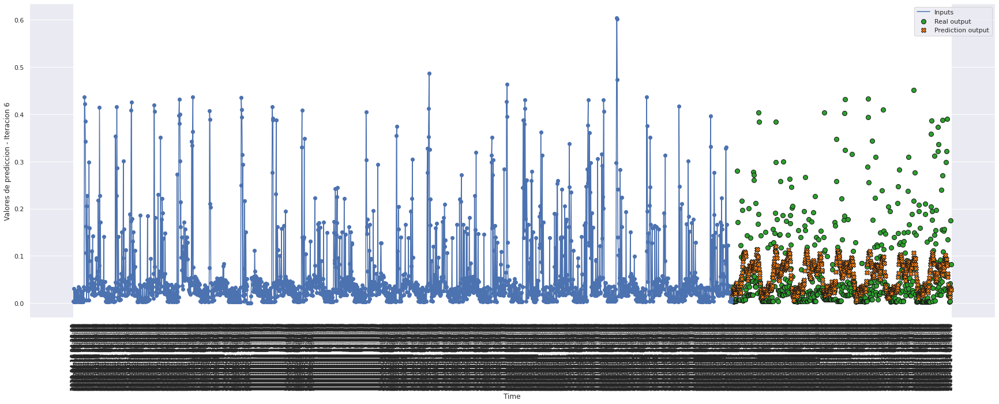

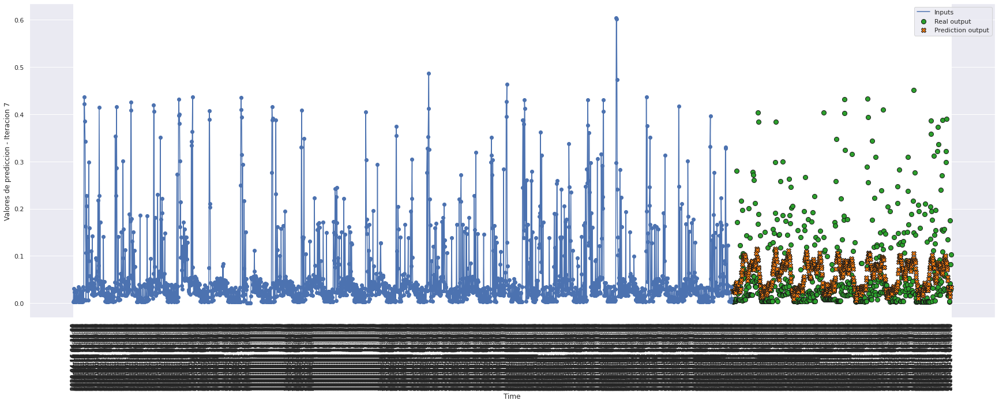

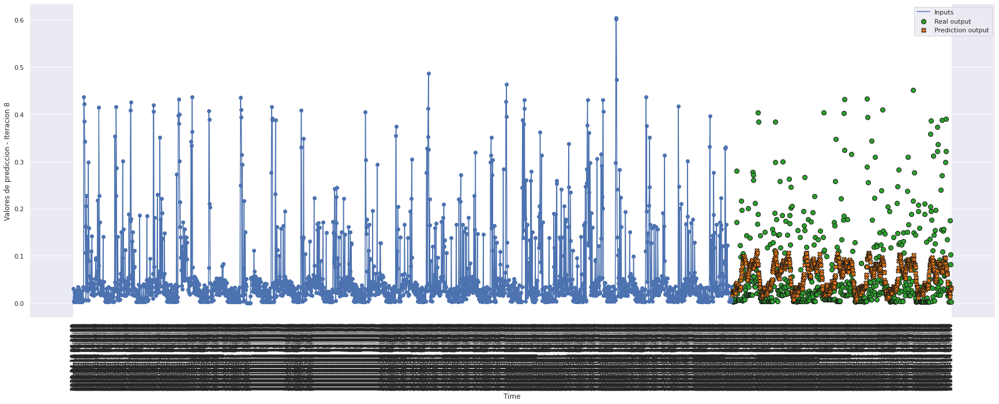

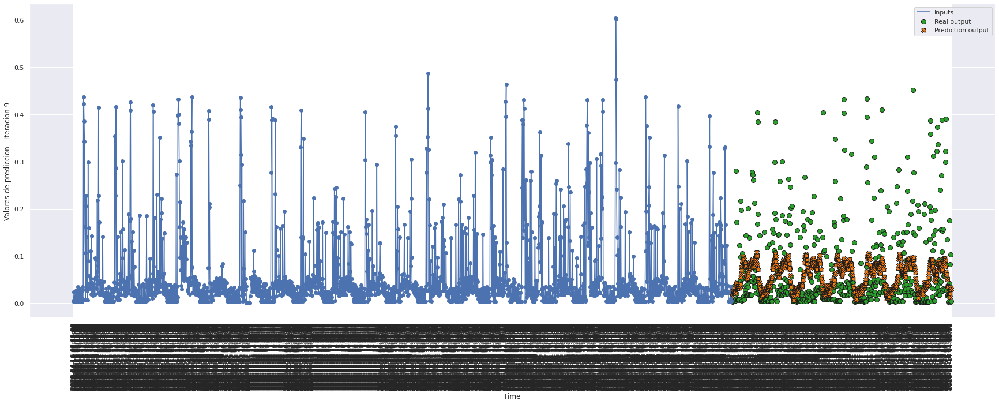

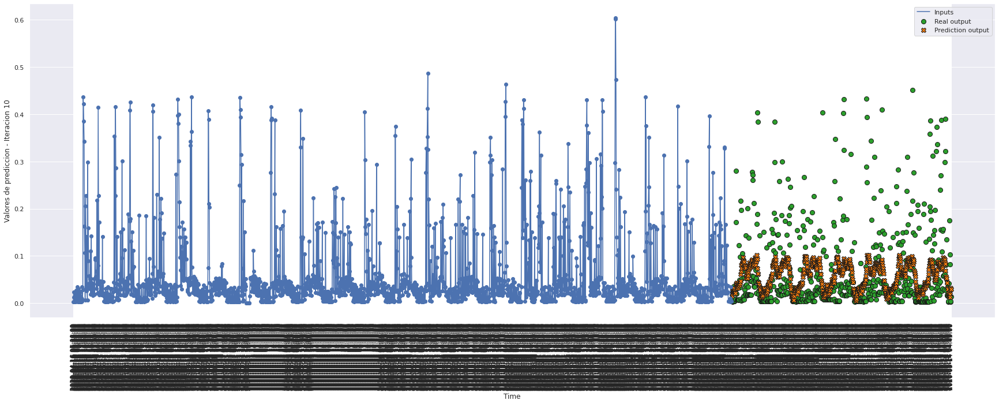

In [55]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

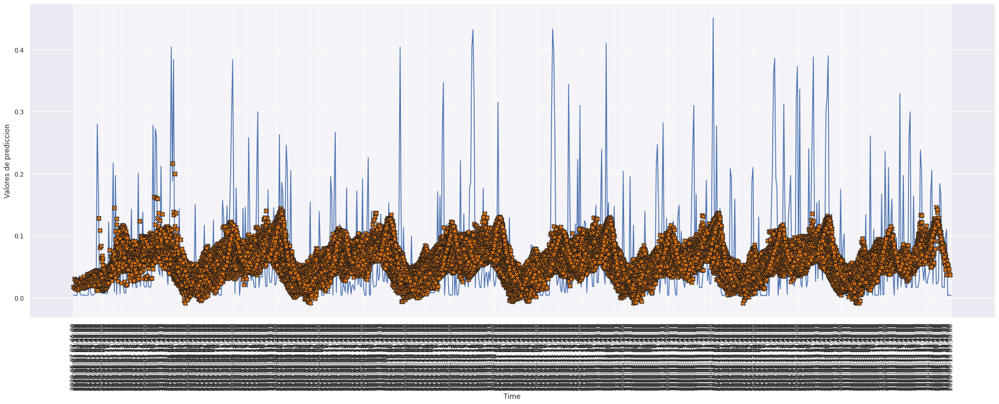

In [56]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 100)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [33]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model11 = build_model11()
model11.summary()

2022-06-25 10:55:02.417102: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-25 10:55:02.947076: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30334 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 2016, 128)         50304     
                                                                 
 gru_1 (GRU)                 (None, 128)               99072     
                                                                 
 dense (Dense)               (None, 672)               86688     
                                                                 
Total params: 236,064
Trainable params: 236,064
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-25 10:55:06.545830: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


333/333 [==============================] - 74s 214ms/step - loss: 0.0068 - mae: 0.0495 - mse: 0.0068 - smape: 0.8750 - val_loss: 0.0070 - val_mae: 0.0488 - val_mse: 0.0070 - val_smape: 0.8684
Epoch 2/200
333/333 [==============================] - 71s 212ms/step - loss: 0.0062 - mae: 0.0476 - mse: 0.0062 - smape: 0.8474 - val_loss: 0.0069 - val_mae: 0.0492 - val_mse: 0.0069 - val_smape: 0.8717
Epoch 3/200
333/333 [==============================] - 70s 211ms/step - loss: 0.0060 - mae: 0.0466 - mse: 0.0060 - smape: 0.8256 - val_loss: 0.0068 - val_mae: 0.0490 - val_mse: 0.0068 - val_smape: 0.8609
Epoch 4/200
333/333 [==============================] - 70s 211ms/step - loss: 0.0059 - mae: 0.0460 - mse: 0.0059 - smape: 0.8118 - val_loss: 0.0070 - val_mae: 0.0491 - val_mse: 0.0070 - val_smape: 0.8729
Epoch 5/200
333/333 [==============================] - 71s 212ms/step - loss: 0.0058 - mae: 0.0455 - mse: 0.0058 - smape: 0.7990 - val_loss: 0.0067 - val_mae: 0.0484 - val_mse: 0.0067 - val_smape:

333/333 [==============================] - 71s 213ms/step - loss: 0.0053 - mae: 0.0428 - mse: 0.0053 - smape: 0.7646 - val_loss: 0.0069 - val_mae: 0.0472 - val_mse: 0.0069 - val_smape: 0.8239
Epoch 42/200
333/333 [==============================] - 71s 212ms/step - loss: 0.0056 - mae: 0.0443 - mse: 0.0056 - smape: 0.7903 - val_loss: 0.0069 - val_mae: 0.0494 - val_mse: 0.0069 - val_smape: 0.8741
Epoch 43/200
333/333 [==============================] - 71s 212ms/step - loss: 0.0057 - mae: 0.0446 - mse: 0.0057 - smape: 0.7906 - val_loss: 0.0068 - val_mae: 0.0483 - val_mse: 0.0068 - val_smape: 0.8399
Epoch 44/200
333/333 [==============================] - 70s 211ms/step - loss: 0.0054 - mae: 0.0433 - mse: 0.0054 - smape: 0.7723 - val_loss: 0.0068 - val_mae: 0.0477 - val_mse: 0.0068 - val_smape: 0.8310
Epoch 45/200
333/333 [==============================] - 70s 211ms/step - loss: 0.0054 - mae: 0.0428 - mse: 0.0054 - smape: 0.7649 - val_loss: 0.0067 - val_mae: 0.0473 - val_mse: 0.0067 - val_sm

In [36]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006795,0.049517,0.006795,0.875015,0.006959,0.048766,0.006959,0.868423,0
1,0.006214,0.047578,0.006214,0.847436,0.006935,0.049190,0.006935,0.871683,1
2,0.006005,0.046648,0.006005,0.825555,0.006840,0.049018,0.006840,0.860863,2
3,0.005893,0.046006,0.005893,0.811798,0.006997,0.049089,0.006997,0.872927,3
4,0.005843,0.045510,0.005843,0.799030,0.006728,0.048367,0.006728,0.842732,4
...,...,...,...,...,...,...,...,...,...
73,0.005082,0.041652,0.005082,0.754728,0.007204,0.047376,0.007204,0.825876,73
74,0.005074,0.041625,0.005074,0.754447,0.007017,0.045566,0.007017,0.809503,74
75,0.005056,0.041539,0.005056,0.753360,0.006962,0.045972,0.006962,0.816060,75
76,0.005049,0.041509,0.005049,0.753174,0.007358,0.046922,0.007358,0.817582,76


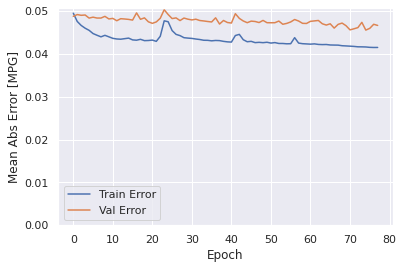

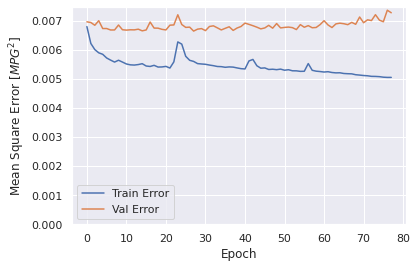

In [37]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [38]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

1329/1329 [==============================] - 87s 65ms/step - loss: 0.0050 - mae: 0.0413 - mse: 0.0050 - smape: 0.7506
Loss:0.005039022769778967
MAE:0.04133343696594238
MSE:0.005039022769778967
SMAPE:0.7506340742111206


In [39]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

219/219 [==============================] - 15s 70ms/step - loss: 0.0073 - mae: 0.0467 - mse: 0.0073 - smape: 0.8177
Loss:0.007269941736012697
MAE:0.046654634177684784
MSE:0.007269941736012697
SMAPE:0.817748486995697


In [40]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

219/219 [==============================] - 15s 69ms/step - loss: 0.0062 - mae: 0.0449 - mse: 0.0062 - smape: 0.7695
Loss:0.0062185488641262054
MAE:0.04485487937927246
MSE:0.0062185488641262054
SMAPE:0.7694612741470337


### Comparativa de resultados

In [41]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041513,0.005049,0.753437,0.071056
VALIDACION,0.046655,0.007270,0.818429,0.085264
TEST,0.044855,0.006219,0.769461,0.078858


### Obtener predicciones

In [42]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

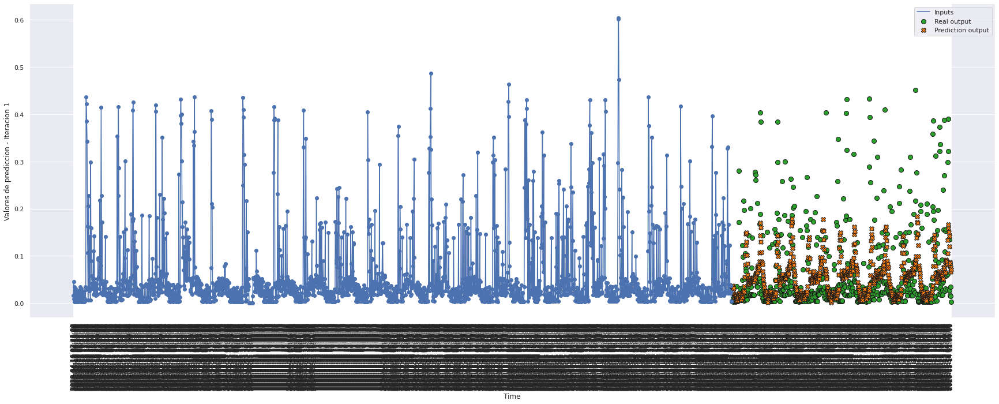

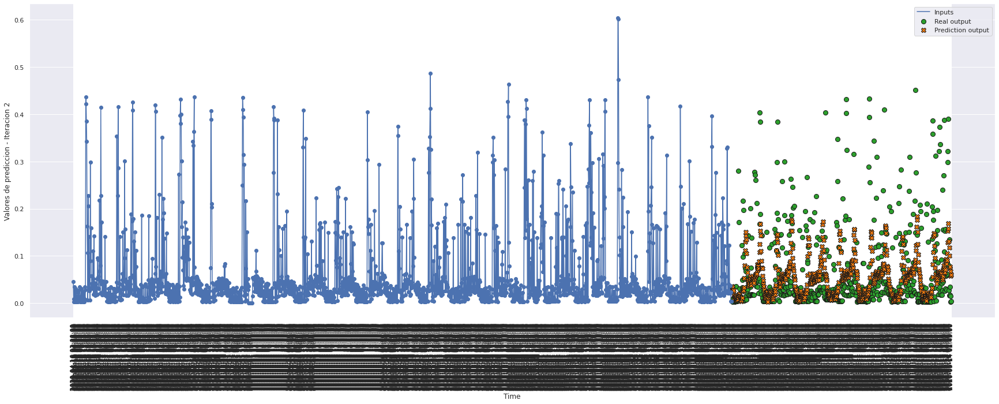

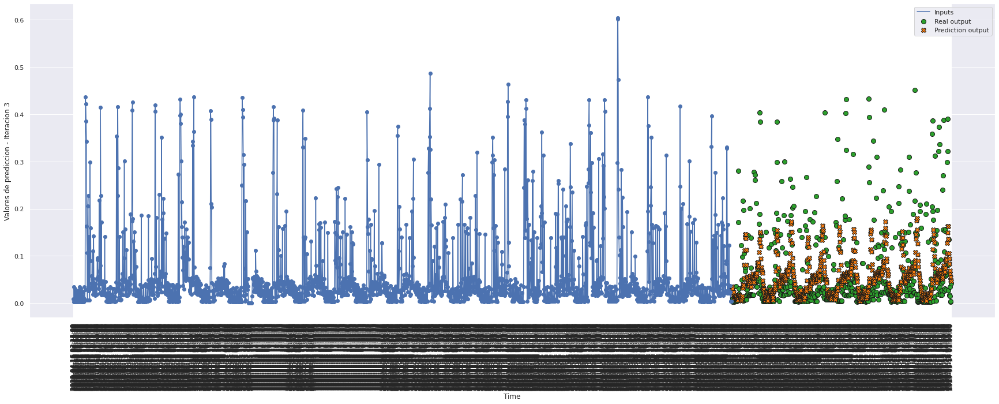

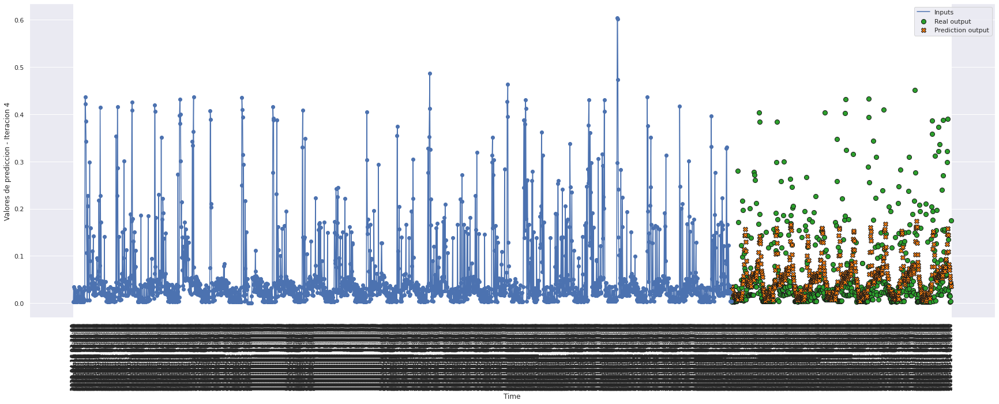

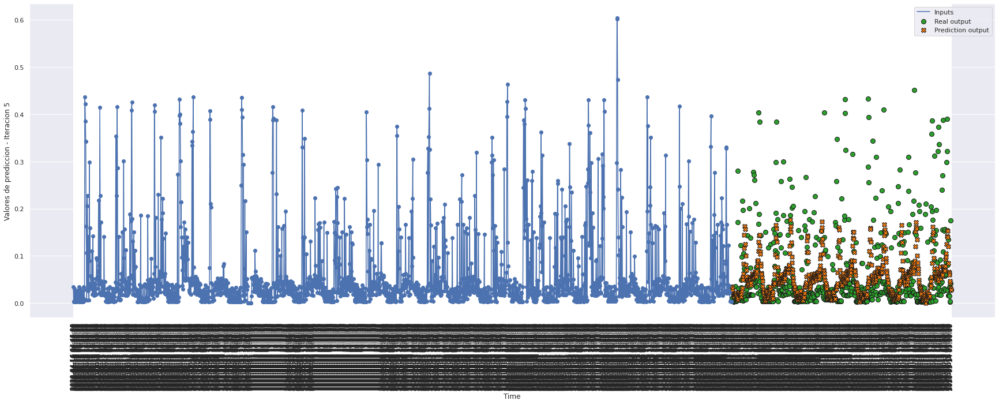

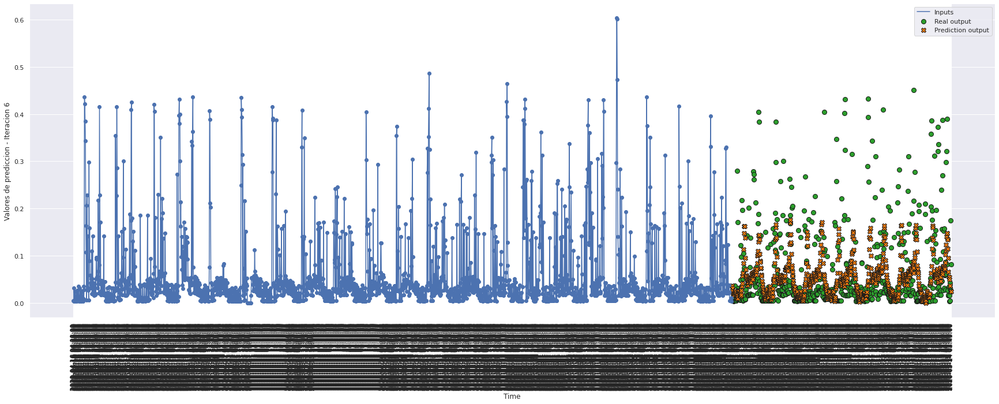

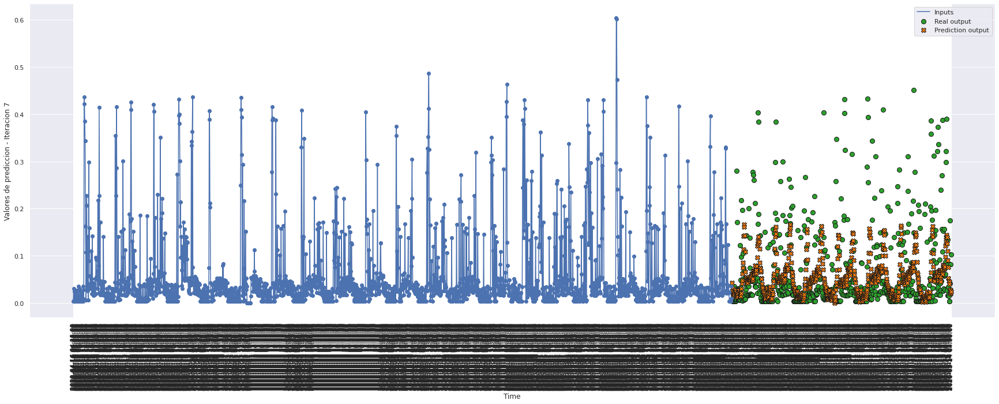

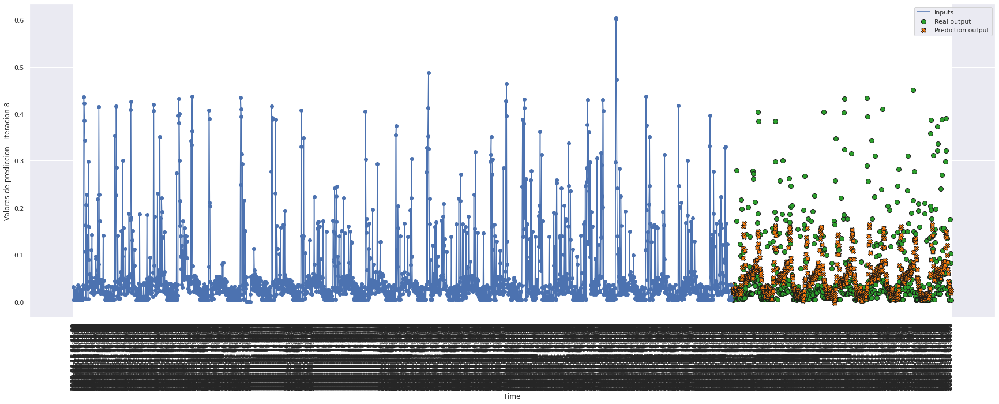

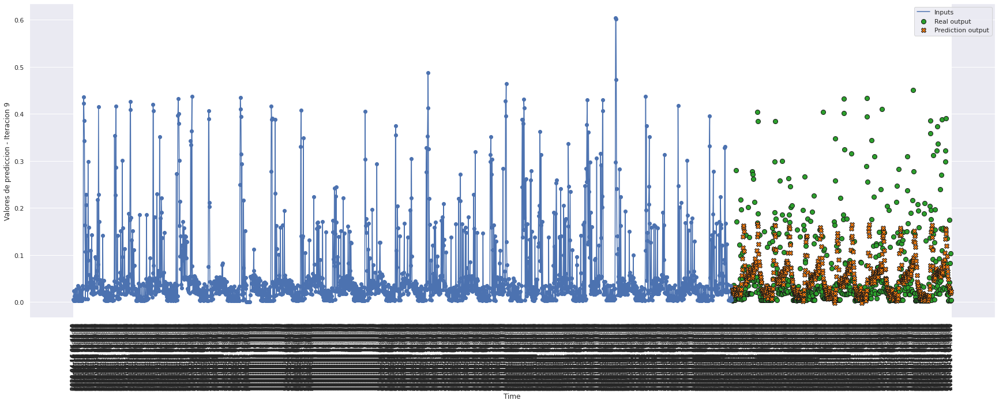

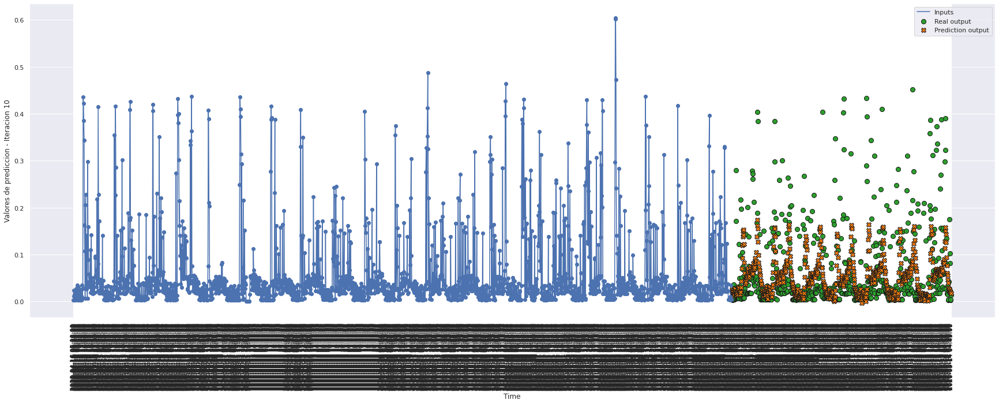

In [43]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

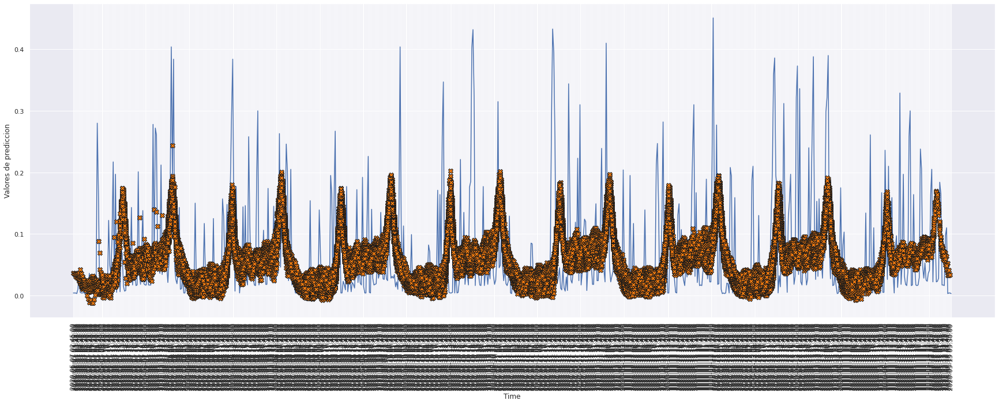

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 100)

# Comparación de modelos

In [70]:
idx = ['LSTM 2 Layer', 'GRU 1 Layer', 'GRU 2 Layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana sólo valor 2016 - 672")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 2 Layer,0.040939,0.004864,0.749622,0.069741,0.046834,0.007117,0.816675,0.084365,0.046730,0.006586,0.774191,0.081154
GRU 1 Layer,0.047718,0.006322,0.838204,0.079513,0.049572,0.007044,0.875857,0.083926,0.048327,0.006410,0.824069,0.080065
GRU 2 Layer,0.041572,0.005073,0.753697,0.071222,0.046413,0.006880,0.821196,0.082946,0.045546,0.006254,0.761041,0.079084


<AxesSubplot:title={'center':'Comparativa del error en los modelos para la semana del método de ventana de varios pasos sólo valor'}>

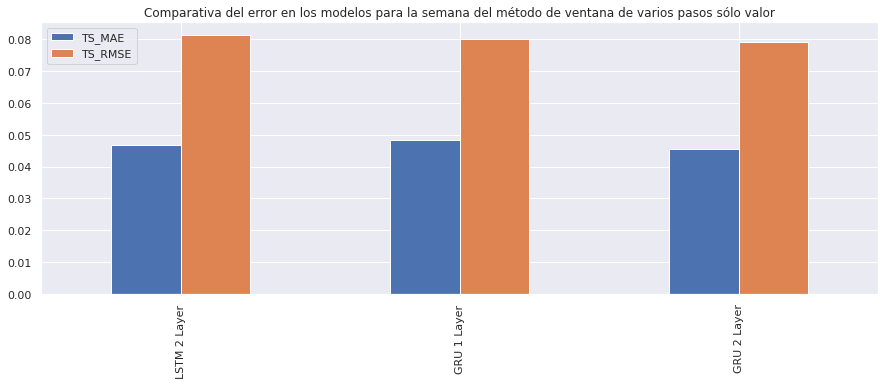

In [75]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para la semana del método de ventana de varios pasos sólo valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para la semana del método de ventana de varios pasos sólo valor'}>

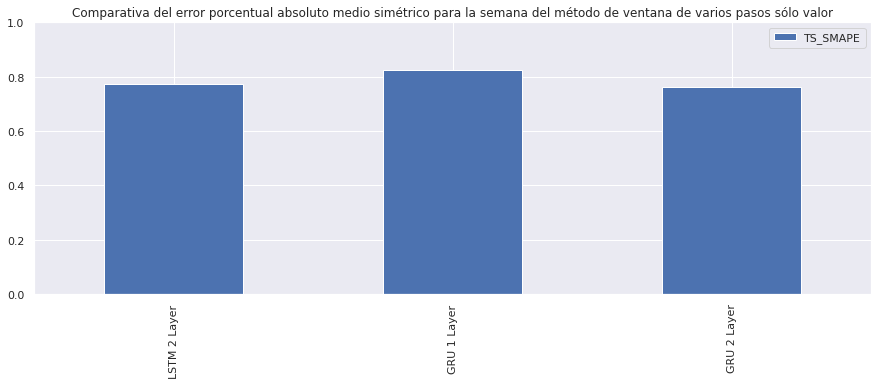

In [76]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 1), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para la semana del método de ventana de varios pasos sólo valor')

# Elección de modelo

In [45]:
model11.save('../../models/only_value/weekModel/1/')

2022-06-25 12:37:58.565117: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../../models/only_value/weekModel/1/assets


INFO:tensorflow:Assets written to: ../../models/only_value/weekModel/1/assets
